# MNIST クラスタ分析



In [1]:
!pip install sklearn
!pip install numpy
!pip install seaborn
!pip install umap-learn
!pip install pyclustering

import os
import gzip
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.decomposition import PCA  # PCA

class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

def get_pca(X, n_components):
    pca = PCA(n_components=n_components)
    pca.fit(X)
    return pca.transform(X)

def load_mnist(path, kind='train'):

    """Load MNIST data from `path`"""
    labels_path = os.path.join(path,
                               '%s-labels-idx1-ubyte.gz'
                               % kind)
    images_path = os.path.join(path,
                               '%s-images-idx3-ubyte.gz'
                               % kind)

    with gzip.open(labels_path, 'rb') as lbpath:
        labels = np.frombuffer(lbpath.read(), dtype=np.uint8,
                               offset=8)

    with gzip.open(images_path, 'rb') as imgpath:
        images = np.frombuffer(imgpath.read(), dtype=np.uint8,
                               offset=16).reshape(len(labels), 784)

    return images, labels

# visualization
def draw_image(data, row, col, n, title:str = None):
    ax = plt.subplot(row, col, n)
    ax.axis("off")
    if title is not None:
        ax.set_title(title, fontdict={'fontsize':8})
    plt.imshow(data, cmap = "gray")

def draw_text(text, row, col, n):
    ax = plt.subplot(row, col, n)
    ax.axis("off")

    # build a rectangle in axes coords
    left, width = .25, .5
    bottom, height = .25, .5
    right = left + width
    top = bottom + height
    ax.text(0.5*(left+right), 0.5*(bottom+top), text,
        horizontalalignment='center',
        verticalalignment='center',
        fontsize=12, color='black',
        transform=ax.transAxes)

def plot_image(X_image, indexes, row=1, col=10, image_size=28, title:str = None):
    fig = plt.figure(figsize=(10, 2))
    if title is not None:
#         plt.gcf().text(0.0, 0.0, title)
        fig.suptitle(title)
    offset = 0
    for index in indexes:
        offset += 1
        draw_image(X_image[index].reshape(image_size,image_size), row, col, offset, index)
    plt.show()

def plot_hist_image(X_image, indexes, row=1, col=10):
    """ヒストグラム作成
    """
    
    fig = plt.figure(figsize=(10, 1))
    offset = 0
    for index in indexes:
        offset += 1

        # ヒストグラムの取得
        img_hist, _ = np.histogram(np.array(X_image[index]).flatten(), bins=np.arange(256+1))

        # ヒストグラムの表示
        ax = plt.subplot(row, col, offset)
        ax.axis("off")
        plt.plot(img_hist, color='black', linewidth = 1)
    plt.show()

    
def plot_image_and_hist(X_image, indexes, prefix, n_class, row=20, col=10):
   
    fig = plt.figure(figsize=(10, 20))
    fig.suptitle(f'{prefix} Analyze Class:{n_class}', fontsize=20, y=0.925)
    plt.subplots_adjust(wspace=0.2, hspace=0.4)

    offset = 0
    for index in indexes:
        offset += 1

        # 画像表示
        draw_image(X_image[index].reshape(28,28), row, col, offset, str(index))

        # ヒストグラムの取得
        img_hist, _ = np.histogram(np.array(X_image[index]).flatten(), bins=np.arange(256+1))
        # ヒストグラムの表示
        ax = plt.subplot(row, col, offset+col)
        ax.axis("off")
        plt.plot(img_hist, color='black', linewidth = 1)

        if offset % col == 0:
            # ヒストグラム行を飛ばす
            offset += col

    plt.show()


In [2]:
# load data

X_target, y_target = load_mnist('../data/Fashion-MNIST', kind='train')

# 前処理として、画像を最大値255で割って0.0 - 1.0に規格化する。
X_target_n = X_target / 255

print(type(X_target))
print(X_target.shape)

<class 'numpy.ndarray'>
(60000, 784)


In [3]:
classes = np.unique(y_target)
target_indexes={}

# クラス分類
for c in classes:
    target_indexes[c] = np.where(y_target == c)[0]

Class(0) start
change bgm_n_components 64 ===> 32
Class(0) label_num=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31]
経過時間：65.15603470802307
class:0/label:0 = 154 (2.566666666666667%)


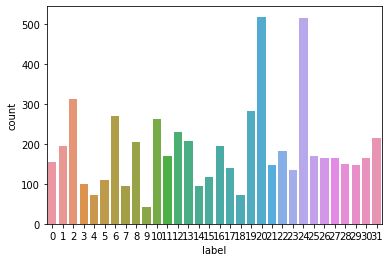

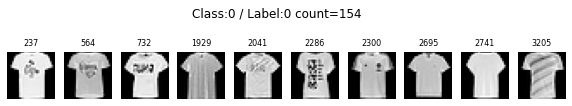

class:0/label:1 = 194 (3.2333333333333334%)


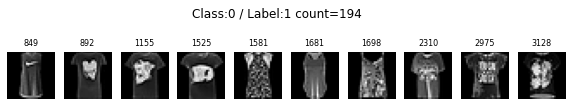

class:0/label:2 = 313 (5.216666666666667%)


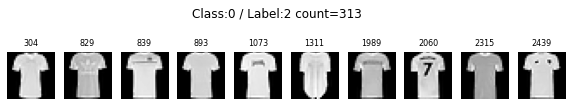

class:0/label:3 = 100 (1.6666666666666667%)


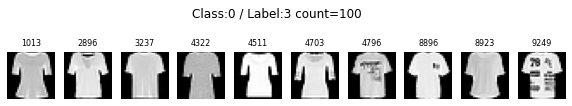

class:0/label:4 = 71 (1.1833333333333333%)


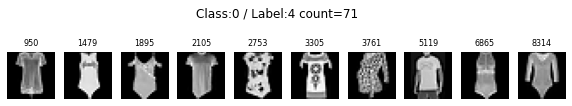

class:0/label:5 = 109 (1.8166666666666667%)


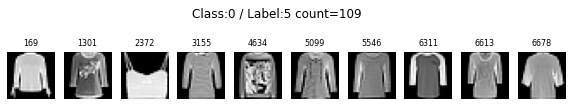

class:0/label:6 = 269 (4.483333333333333%)


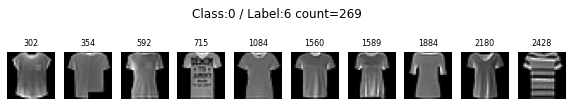

class:0/label:7 = 95 (1.5833333333333333%)


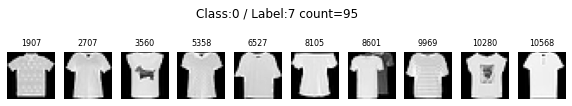

class:0/label:8 = 204 (3.4%)


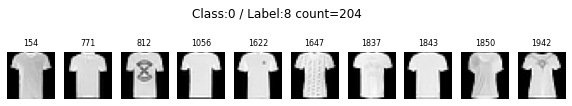

class:0/label:9 = 41 (0.6833333333333333%)


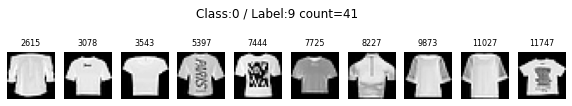

class:0/label:10 = 263 (4.383333333333334%)


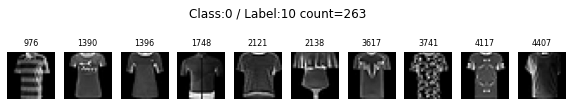

class:0/label:11 = 171 (2.85%)


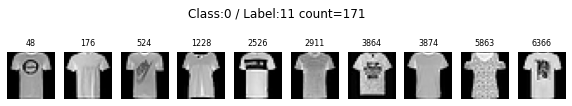

class:0/label:12 = 229 (3.816666666666667%)


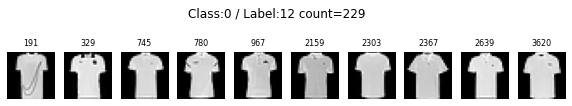

class:0/label:13 = 207 (3.45%)


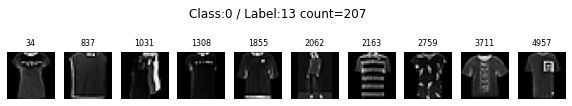

class:0/label:14 = 94 (1.5666666666666667%)


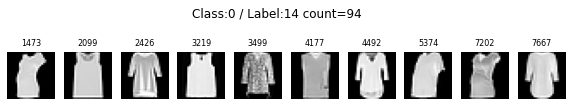

class:0/label:15 = 118 (1.9666666666666666%)


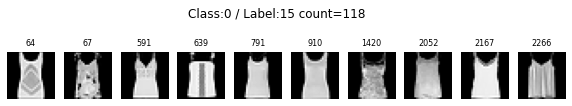

class:0/label:16 = 195 (3.25%)


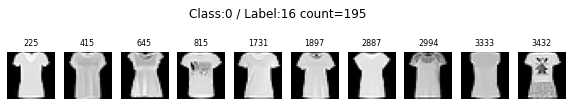

class:0/label:17 = 141 (2.35%)


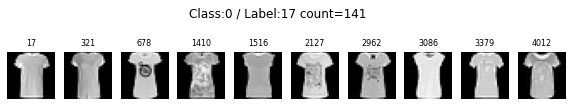

class:0/label:18 = 73 (1.2166666666666666%)


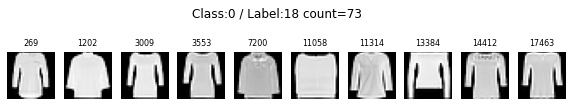

class:0/label:19 = 283 (4.716666666666667%)


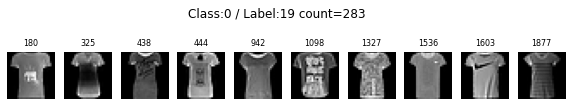

class:0/label:20 = 519 (8.65%)


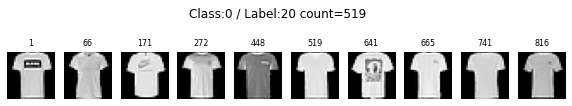

class:0/label:21 = 147 (2.45%)


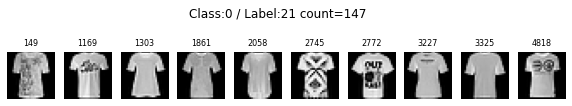

class:0/label:22 = 182 (3.033333333333333%)


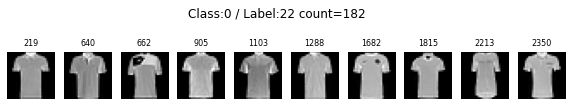

class:0/label:23 = 135 (2.25%)


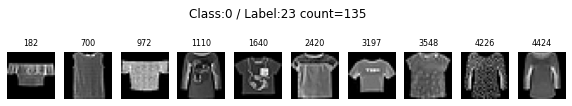

class:0/label:24 = 516 (8.6%)


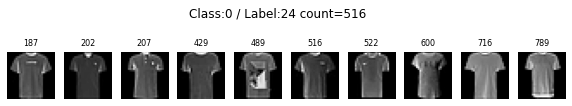

class:0/label:25 = 170 (2.8333333333333335%)


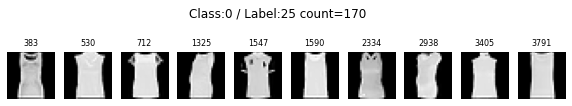

class:0/label:26 = 164 (2.7333333333333334%)


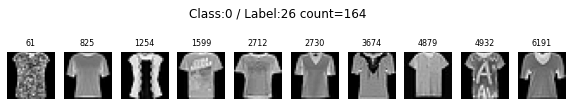

class:0/label:27 = 165 (2.75%)


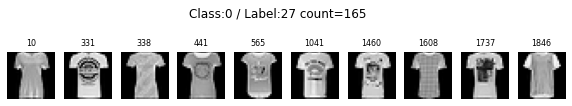

class:0/label:28 = 150 (2.5%)


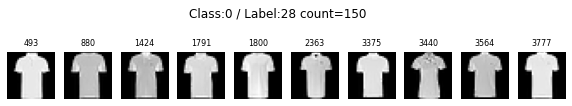

class:0/label:29 = 148 (2.466666666666667%)


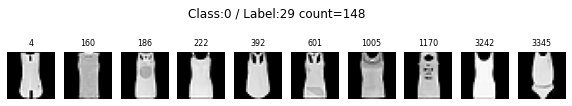

class:0/label:30 = 166 (2.7666666666666666%)


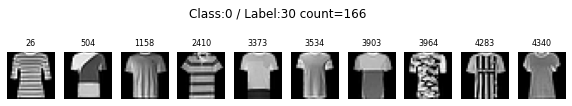

class:0/label:31 = 214 (3.566666666666667%)


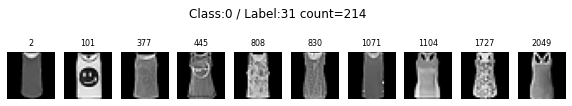

Class(1) start
change bgm_n_components 64 ===> 31
Class(1) label_num=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30]
経過時間：20.69879722595215
class:1/label:0 = 183 (3.05%)


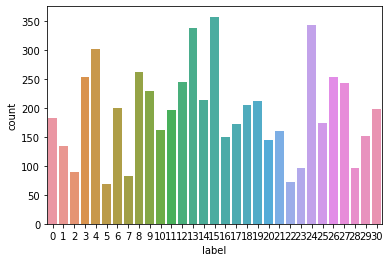

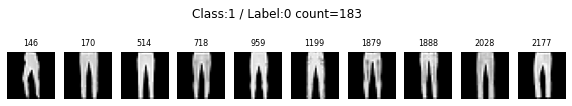

class:1/label:1 = 135 (2.25%)


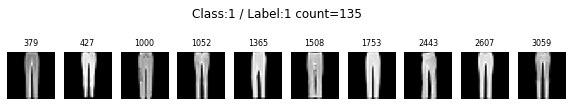

class:1/label:2 = 90 (1.5%)


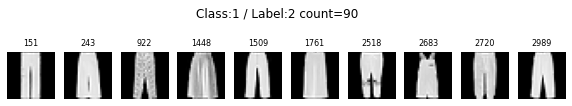

class:1/label:3 = 254 (4.233333333333333%)


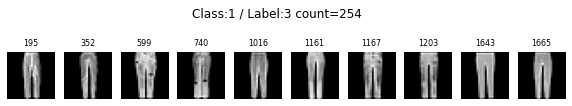

class:1/label:4 = 303 (5.05%)


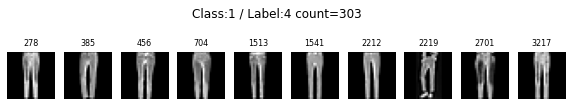

class:1/label:5 = 68 (1.1333333333333333%)


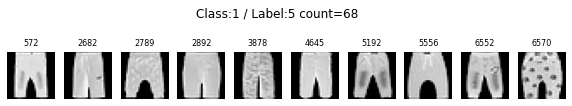

class:1/label:6 = 200 (3.3333333333333335%)


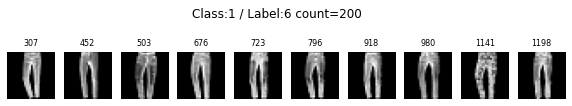

class:1/label:7 = 83 (1.3833333333333333%)


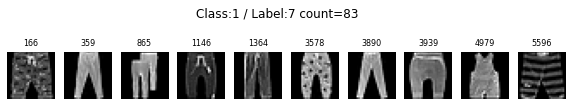

class:1/label:8 = 263 (4.383333333333334%)


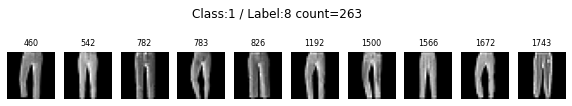

class:1/label:9 = 229 (3.816666666666667%)


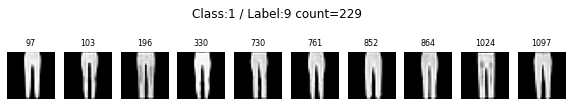

class:1/label:10 = 163 (2.716666666666667%)


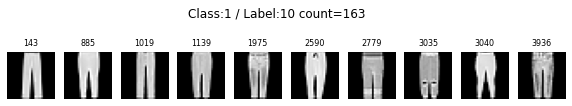

class:1/label:11 = 197 (3.283333333333333%)


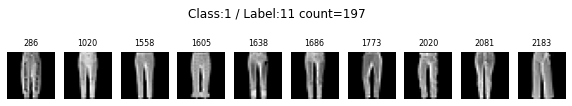

class:1/label:12 = 245 (4.083333333333333%)


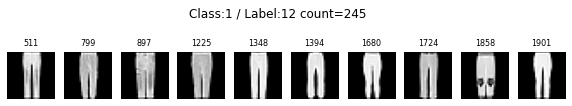

class:1/label:13 = 339 (5.65%)


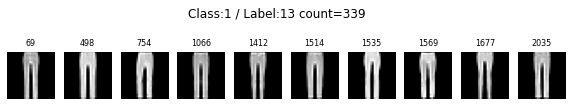

class:1/label:14 = 214 (3.566666666666667%)


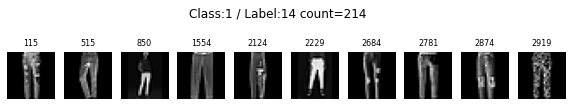

class:1/label:15 = 358 (5.966666666666667%)


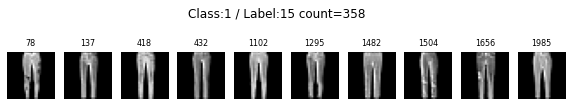

class:1/label:16 = 150 (2.5%)


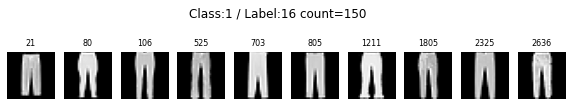

class:1/label:17 = 173 (2.8833333333333333%)


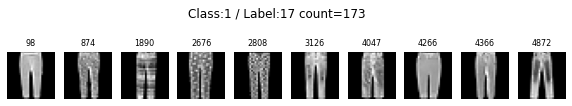

class:1/label:18 = 206 (3.433333333333333%)


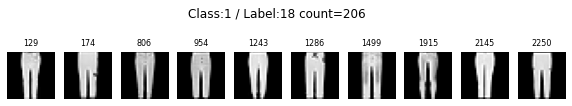

class:1/label:19 = 212 (3.533333333333333%)


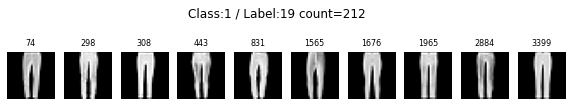

class:1/label:20 = 145 (2.4166666666666665%)


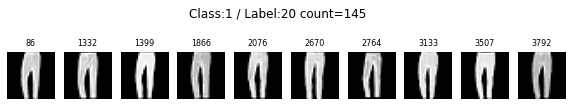

class:1/label:21 = 161 (2.683333333333333%)


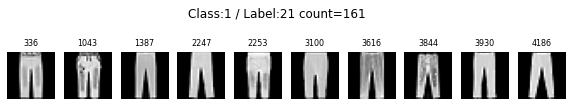

class:1/label:22 = 72 (1.2%)


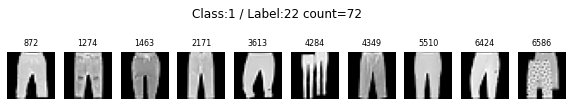

class:1/label:23 = 96 (1.6%)


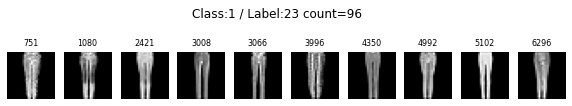

class:1/label:24 = 343 (5.716666666666667%)


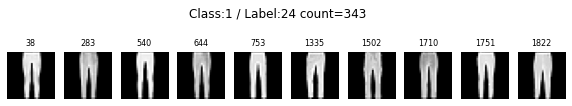

class:1/label:25 = 175 (2.9166666666666665%)


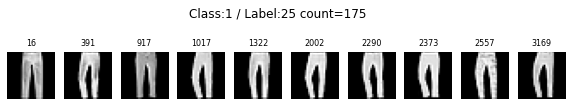

class:1/label:26 = 254 (4.233333333333333%)


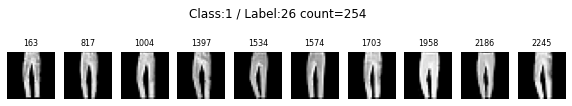

class:1/label:27 = 243 (4.05%)


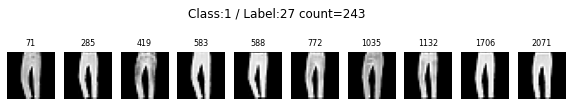

class:1/label:28 = 96 (1.6%)


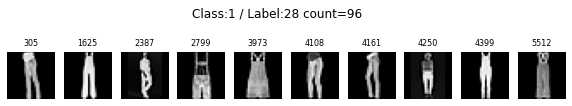

class:1/label:29 = 152 (2.533333333333333%)


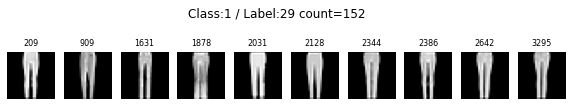

class:1/label:30 = 198 (3.3%)


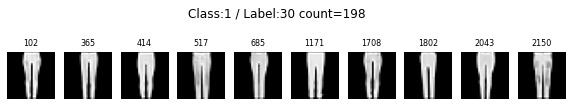

Class(2) start
change bgm_n_components 64 ===> 32
Class(2) label_num=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31]
経過時間：45.38325357437134
class:2/label:0 = 231 (3.85%)


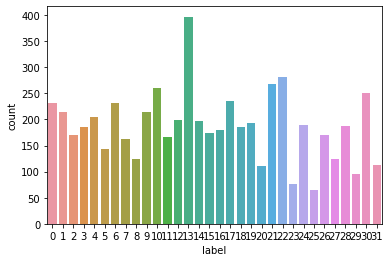

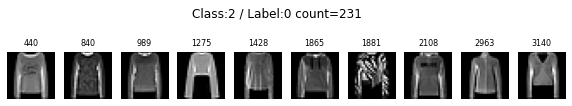

class:2/label:1 = 214 (3.566666666666667%)


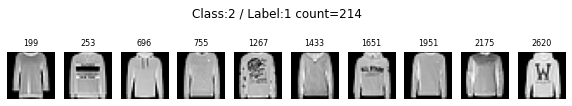

class:2/label:2 = 170 (2.8333333333333335%)


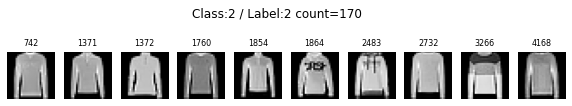

class:2/label:3 = 185 (3.0833333333333335%)


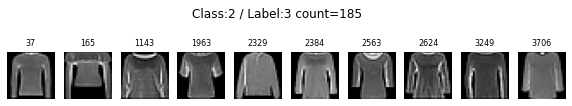

class:2/label:4 = 204 (3.4%)


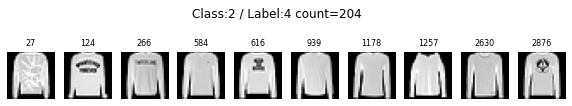

class:2/label:5 = 144 (2.4%)


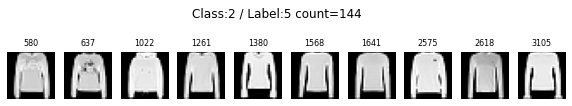

class:2/label:6 = 231 (3.85%)


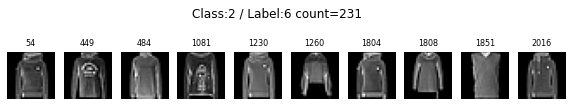

class:2/label:7 = 163 (2.716666666666667%)


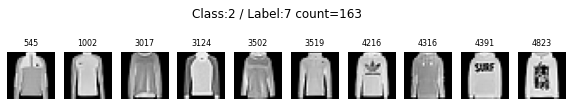

class:2/label:8 = 124 (2.066666666666667%)


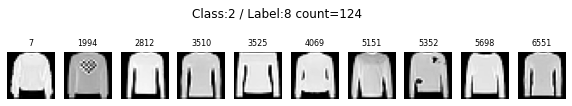

class:2/label:9 = 215 (3.5833333333333335%)


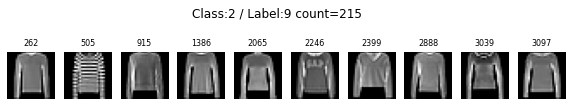

class:2/label:10 = 261 (4.35%)


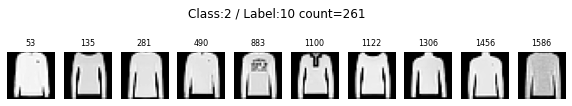

class:2/label:11 = 166 (2.7666666666666666%)


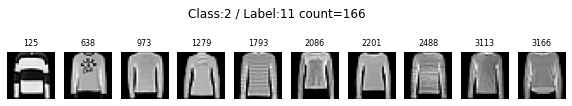

class:2/label:12 = 199 (3.316666666666667%)


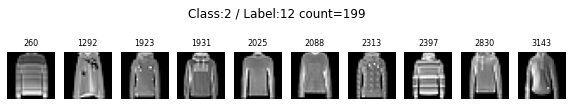

class:2/label:13 = 397 (6.616666666666666%)


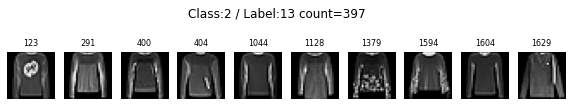

class:2/label:14 = 197 (3.283333333333333%)


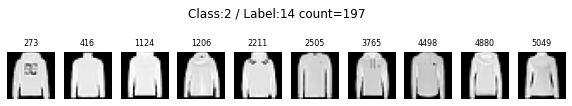

class:2/label:15 = 174 (2.9%)


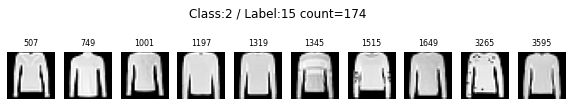

class:2/label:16 = 179 (2.9833333333333334%)


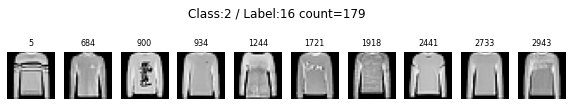

class:2/label:17 = 236 (3.933333333333333%)


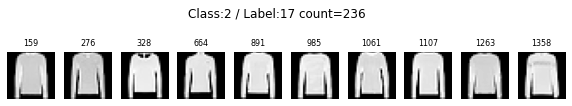

class:2/label:18 = 185 (3.0833333333333335%)


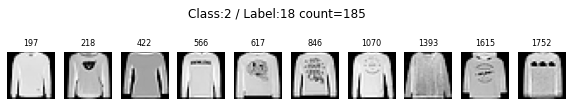

class:2/label:19 = 193 (3.216666666666667%)


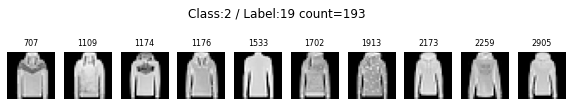

class:2/label:20 = 110 (1.8333333333333333%)


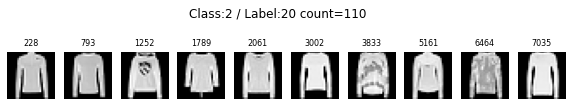

class:2/label:21 = 268 (4.466666666666667%)


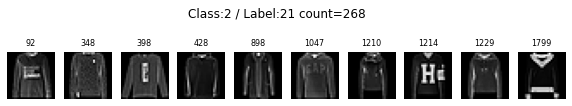

class:2/label:22 = 281 (4.683333333333334%)


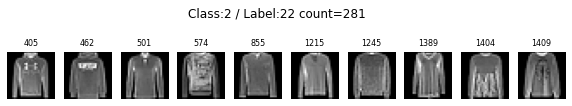

class:2/label:23 = 77 (1.2833333333333334%)


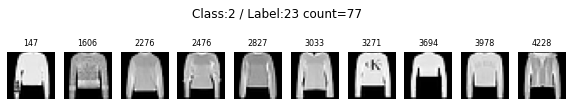

class:2/label:24 = 190 (3.1666666666666665%)


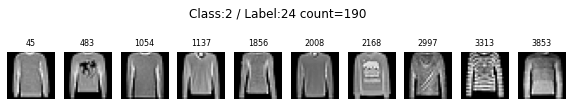

class:2/label:25 = 64 (1.0666666666666667%)


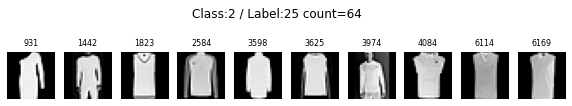

class:2/label:26 = 171 (2.85%)


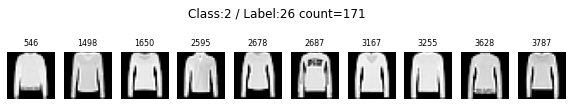

class:2/label:27 = 124 (2.066666666666667%)


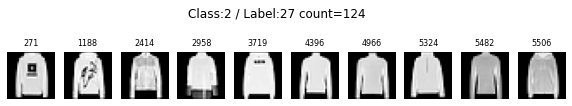

class:2/label:28 = 188 (3.1333333333333333%)


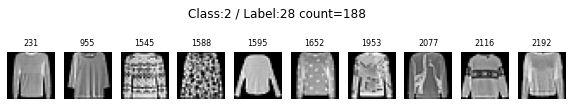

class:2/label:29 = 96 (1.6%)


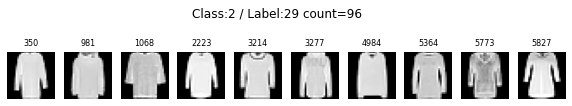

class:2/label:30 = 251 (4.183333333333334%)


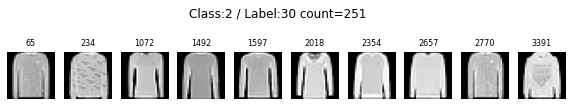

class:2/label:31 = 112 (1.8666666666666667%)


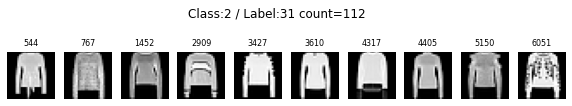

Class(3) start
change bgm_n_components 64 ===> 31
Class(3) label_num=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30]
経過時間：23.80118489265442
class:3/label:0 = 124 (2.066666666666667%)


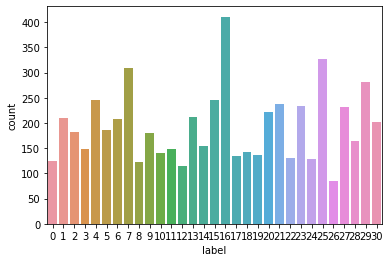

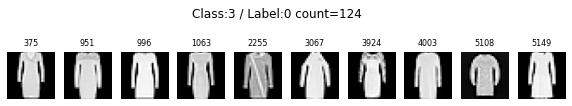

class:3/label:1 = 210 (3.5%)


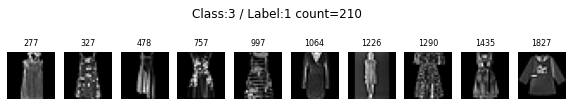

class:3/label:2 = 183 (3.05%)


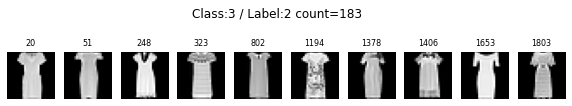

class:3/label:3 = 149 (2.4833333333333334%)


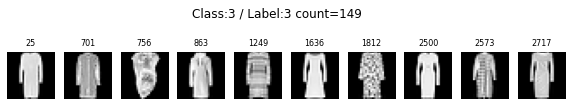

class:3/label:4 = 245 (4.083333333333333%)


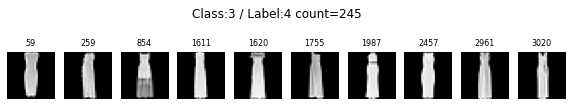

class:3/label:5 = 186 (3.1%)


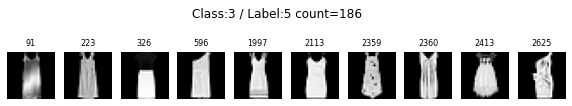

class:3/label:6 = 208 (3.466666666666667%)


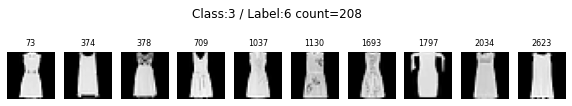

class:3/label:7 = 310 (5.166666666666667%)


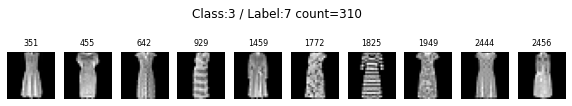

class:3/label:8 = 122 (2.033333333333333%)


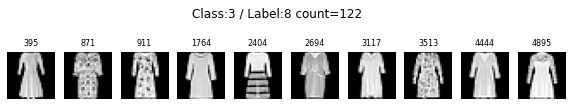

class:3/label:9 = 181 (3.0166666666666666%)


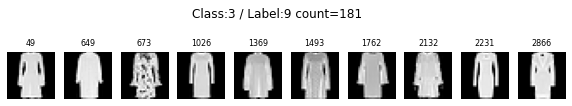

class:3/label:10 = 141 (2.35%)


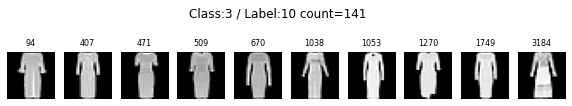

class:3/label:11 = 149 (2.4833333333333334%)


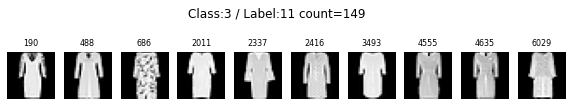

class:3/label:12 = 115 (1.9166666666666667%)


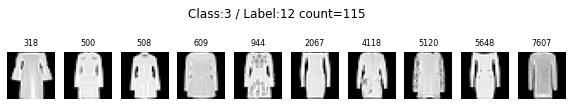

class:3/label:13 = 212 (3.533333333333333%)


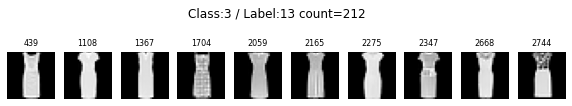

class:3/label:14 = 154 (2.566666666666667%)


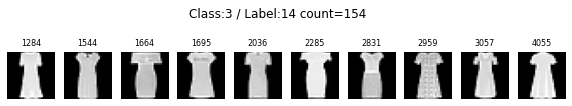

class:3/label:15 = 246 (4.1%)


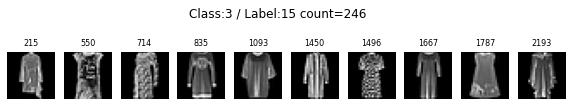

class:3/label:16 = 411 (6.85%)


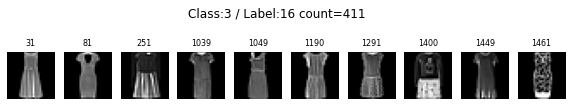

class:3/label:17 = 134 (2.2333333333333334%)


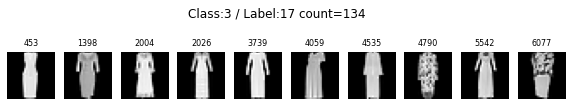

class:3/label:18 = 142 (2.3666666666666667%)


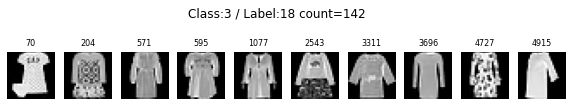

class:3/label:19 = 136 (2.2666666666666666%)


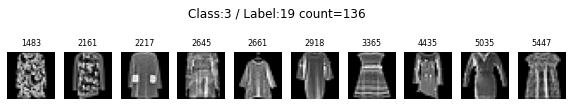

class:3/label:20 = 222 (3.7%)


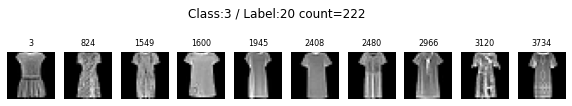

class:3/label:21 = 237 (3.95%)


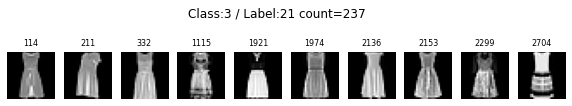

class:3/label:22 = 131 (2.183333333333333%)


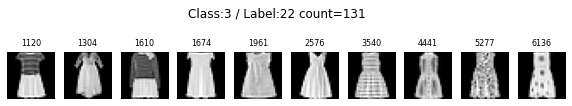

class:3/label:23 = 233 (3.8833333333333333%)


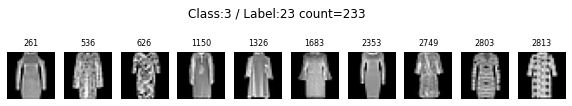

class:3/label:24 = 129 (2.15%)


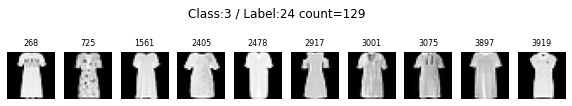

class:3/label:25 = 327 (5.45%)


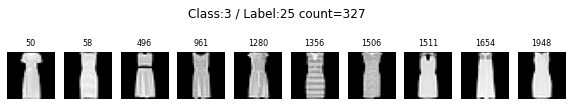

class:3/label:26 = 84 (1.4%)


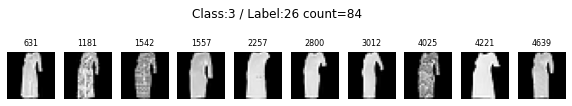

class:3/label:27 = 232 (3.8666666666666667%)


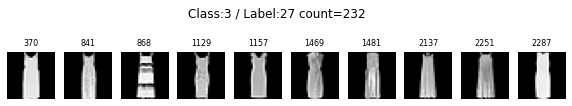

class:3/label:28 = 164 (2.7333333333333334%)


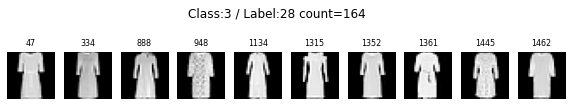

class:3/label:29 = 281 (4.683333333333334%)


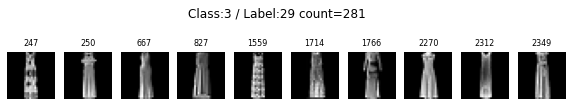

class:3/label:30 = 202 (3.3666666666666667%)


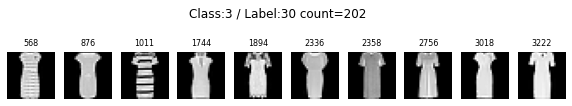

Class(4) start
change bgm_n_components 64 ===> 34
Class(4) label_num=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33]
経過時間：7.539657354354858
class:4/label:0 = 245 (4.083333333333333%)


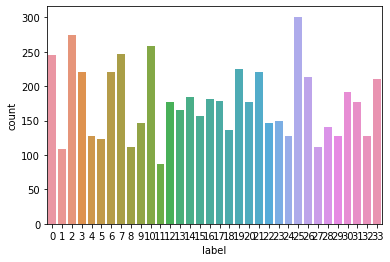

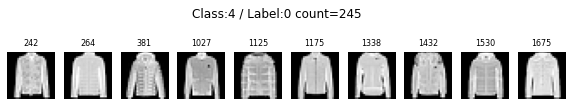

class:4/label:1 = 108 (1.8%)


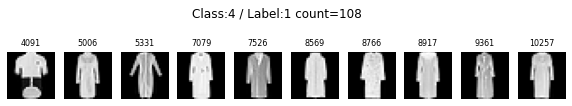

class:4/label:2 = 275 (4.583333333333333%)


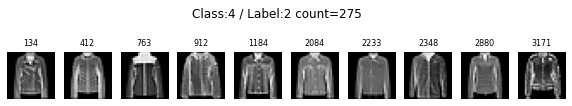

class:4/label:3 = 221 (3.683333333333333%)


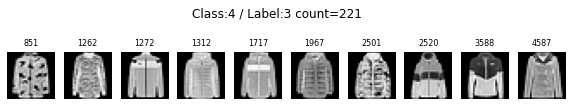

class:4/label:4 = 128 (2.1333333333333333%)


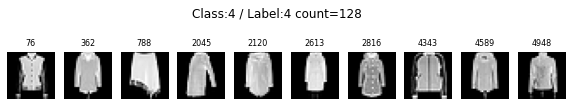

class:4/label:5 = 123 (2.05%)


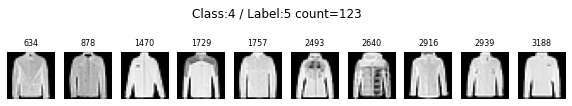

class:4/label:6 = 221 (3.683333333333333%)


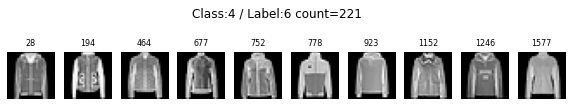

class:4/label:7 = 247 (4.116666666666666%)


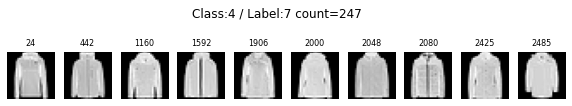

class:4/label:8 = 112 (1.8666666666666667%)


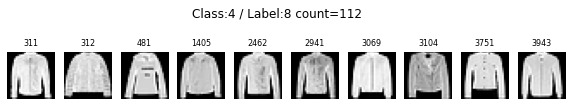

class:4/label:9 = 147 (2.45%)


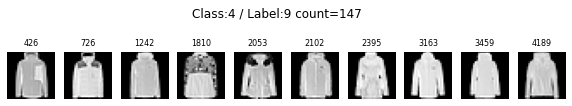

class:4/label:10 = 259 (4.316666666666666%)


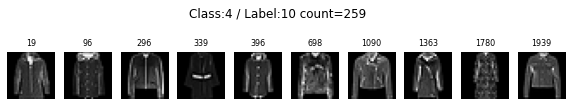

class:4/label:11 = 87 (1.45%)


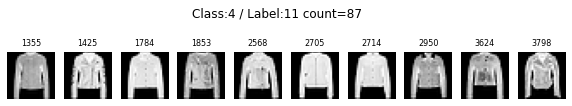

class:4/label:12 = 177 (2.95%)


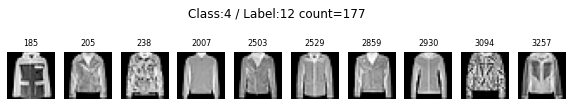

class:4/label:13 = 165 (2.75%)


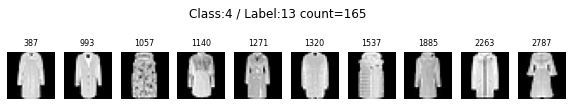

class:4/label:14 = 185 (3.0833333333333335%)


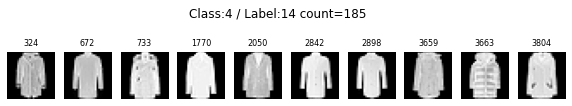

class:4/label:15 = 157 (2.6166666666666667%)


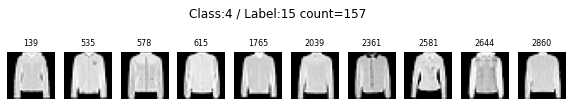

class:4/label:16 = 181 (3.0166666666666666%)


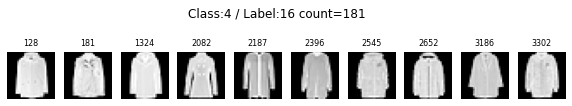

class:4/label:17 = 179 (2.9833333333333334%)


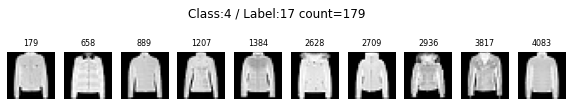

class:4/label:18 = 137 (2.283333333333333%)


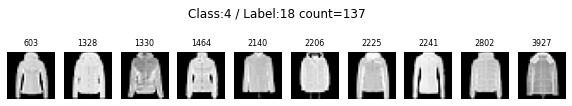

class:4/label:19 = 225 (3.75%)


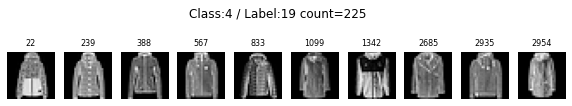

class:4/label:20 = 177 (2.95%)


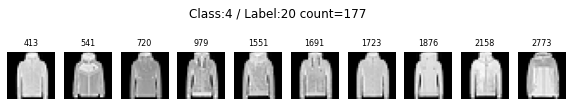

class:4/label:21 = 221 (3.683333333333333%)


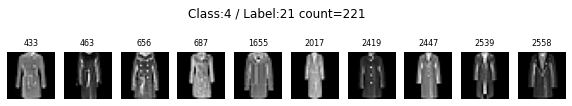

class:4/label:22 = 146 (2.433333333333333%)


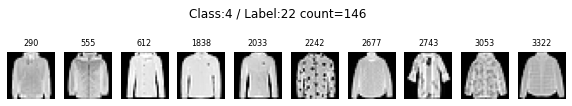

class:4/label:23 = 150 (2.5%)


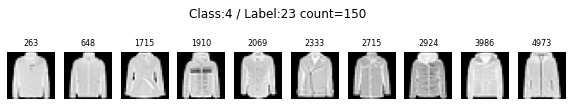

class:4/label:24 = 128 (2.1333333333333333%)


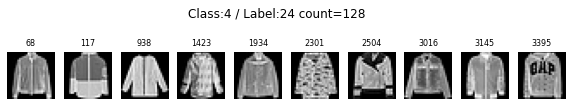

class:4/label:25 = 301 (5.016666666666667%)


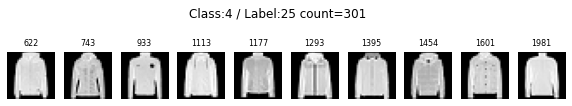

class:4/label:26 = 213 (3.55%)


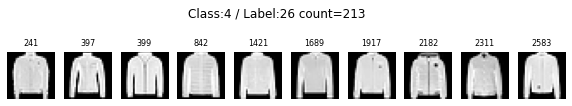

class:4/label:27 = 111 (1.85%)


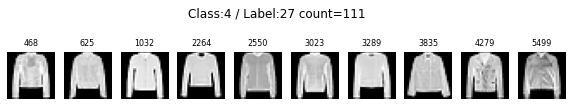

class:4/label:28 = 140 (2.3333333333333335%)


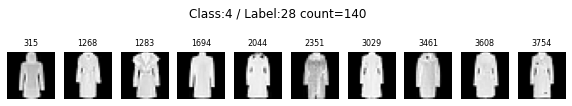

class:4/label:29 = 127 (2.1166666666666667%)


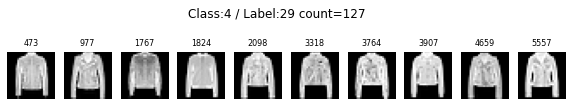

class:4/label:30 = 191 (3.183333333333333%)


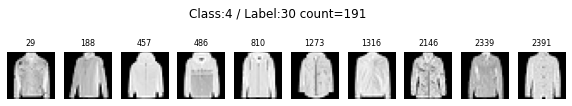

class:4/label:31 = 177 (2.95%)


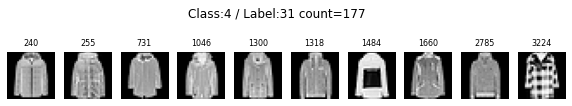

class:4/label:32 = 128 (2.1333333333333333%)


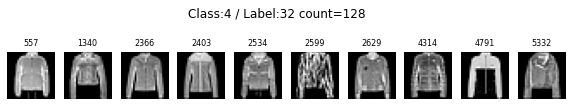

class:4/label:33 = 211 (3.5166666666666666%)


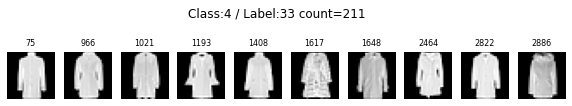

Class(5) start
change bgm_n_components 64 ===> 28
Class(5) label_num=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27]
経過時間：32.10801959037781
class:5/label:0 = 140 (2.3333333333333335%)


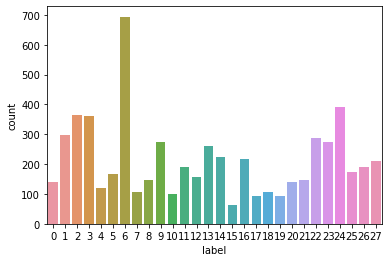

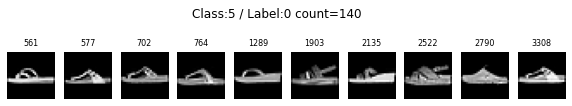

class:5/label:1 = 297 (4.95%)


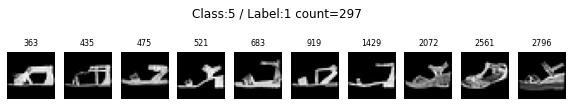

class:5/label:2 = 364 (6.066666666666666%)


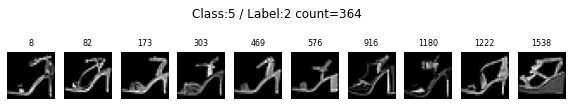

class:5/label:3 = 362 (6.033333333333333%)


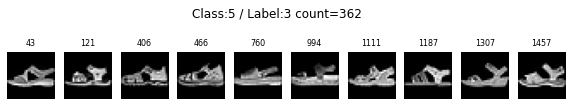

class:5/label:4 = 120 (2.0%)


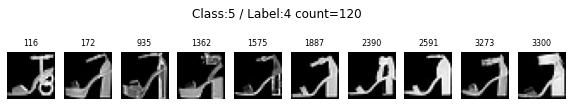

class:5/label:5 = 168 (2.8%)


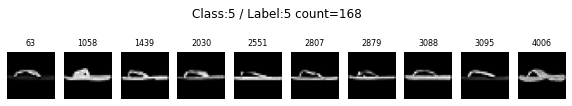

class:5/label:6 = 694 (11.566666666666666%)


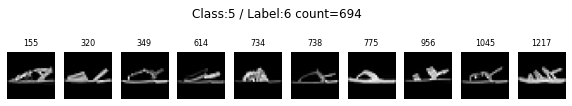

class:5/label:7 = 107 (1.7833333333333334%)


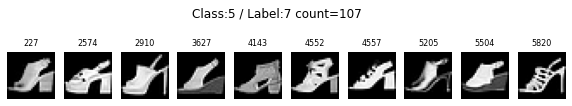

class:5/label:8 = 148 (2.466666666666667%)


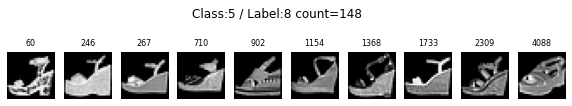

class:5/label:9 = 275 (4.583333333333333%)


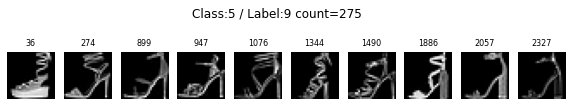

class:5/label:10 = 101 (1.6833333333333333%)


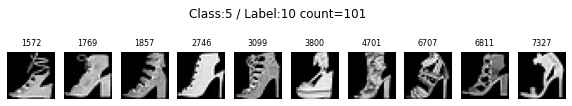

class:5/label:11 = 190 (3.1666666666666665%)


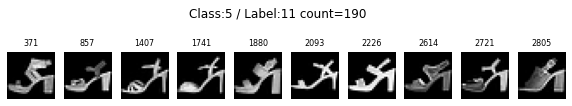

class:5/label:12 = 156 (2.6%)


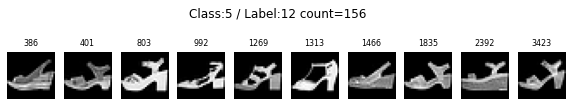

class:5/label:13 = 262 (4.366666666666666%)


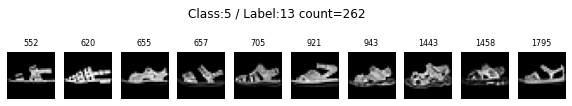

class:5/label:14 = 223 (3.716666666666667%)


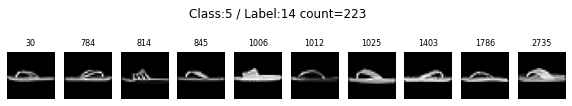

class:5/label:15 = 63 (1.05%)


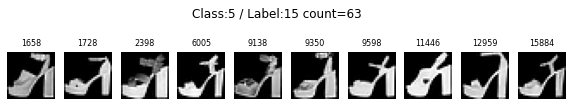

class:5/label:16 = 218 (3.6333333333333333%)


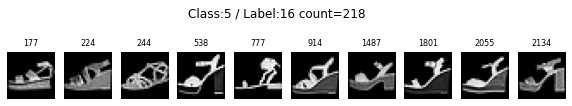

class:5/label:17 = 92 (1.5333333333333334%)


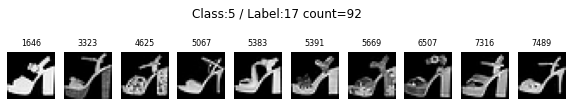

class:5/label:18 = 107 (1.7833333333333334%)


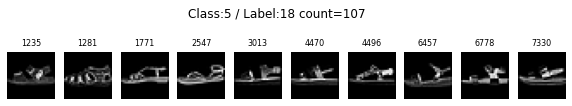

class:5/label:19 = 93 (1.55%)


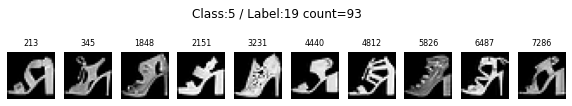

class:5/label:20 = 140 (2.3333333333333335%)


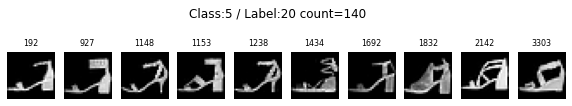

class:5/label:21 = 147 (2.45%)


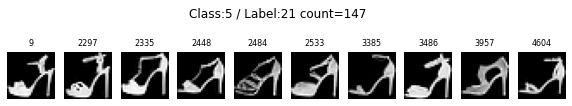

class:5/label:22 = 288 (4.8%)


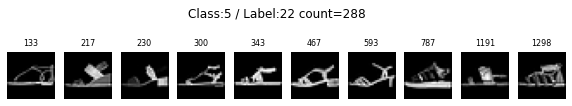

class:5/label:23 = 275 (4.583333333333333%)


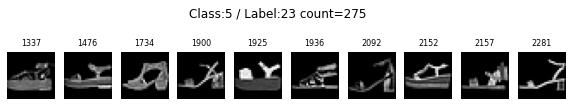

class:5/label:24 = 393 (6.55%)


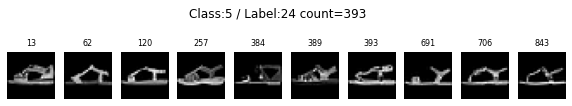

class:5/label:25 = 173 (2.8833333333333333%)


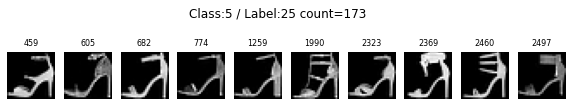

class:5/label:26 = 192 (3.2%)


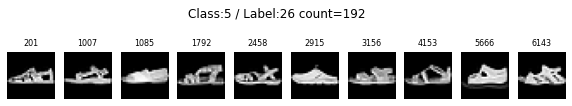

class:5/label:27 = 212 (3.533333333333333%)


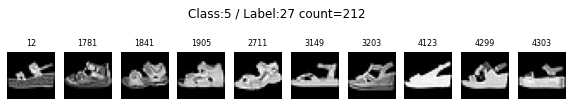

Class(6) start
change bgm_n_components 64 ===> 26
Class(6) label_num=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25]
経過時間：26.339784860610962
class:6/label:0 = 363 (6.05%)


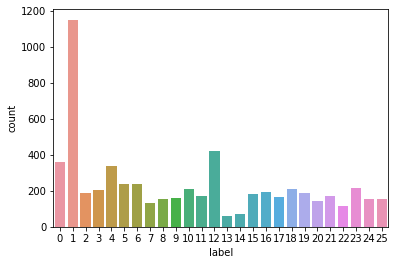

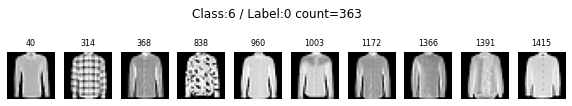

class:6/label:1 = 1152 (19.2%)


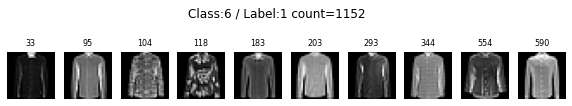

class:6/label:2 = 188 (3.1333333333333333%)


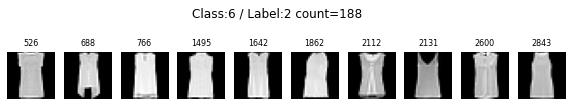

class:6/label:3 = 205 (3.4166666666666665%)


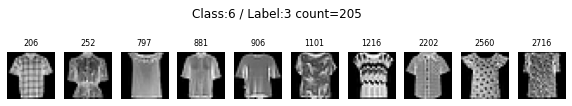

class:6/label:4 = 340 (5.666666666666667%)


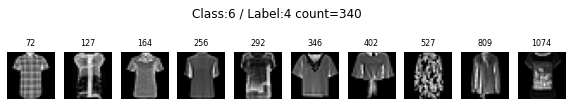

class:6/label:5 = 238 (3.966666666666667%)


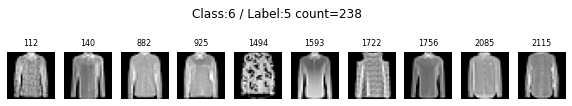

class:6/label:6 = 236 (3.933333333333333%)


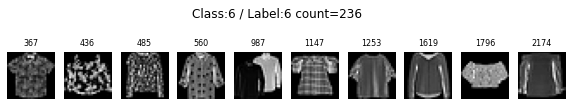

class:6/label:7 = 131 (2.183333333333333%)


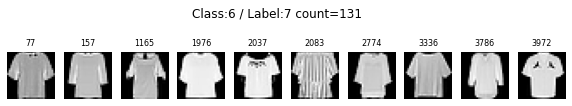

class:6/label:8 = 156 (2.6%)


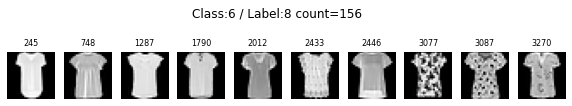

class:6/label:9 = 160 (2.6666666666666665%)


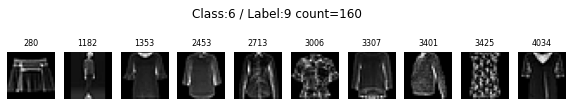

class:6/label:10 = 213 (3.55%)


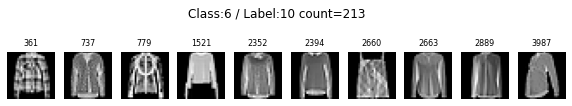

class:6/label:11 = 171 (2.85%)


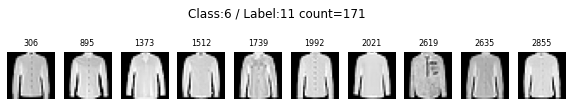

class:6/label:12 = 423 (7.05%)


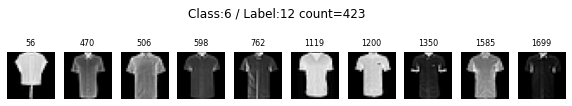

class:6/label:13 = 58 (0.9666666666666667%)


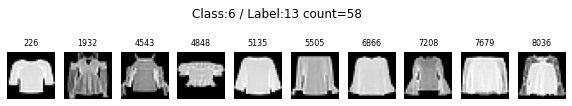

class:6/label:14 = 73 (1.2166666666666666%)


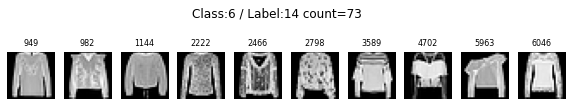

class:6/label:15 = 183 (3.05%)


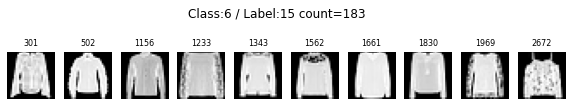

class:6/label:16 = 192 (3.2%)


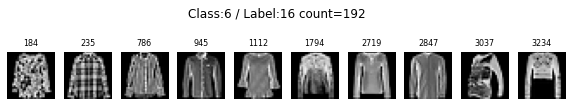

class:6/label:17 = 165 (2.75%)


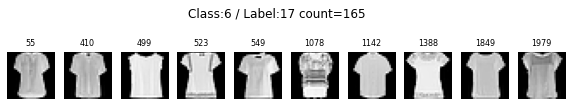

class:6/label:18 = 209 (3.4833333333333334%)


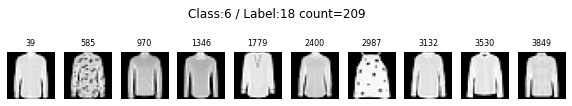

class:6/label:19 = 190 (3.1666666666666665%)


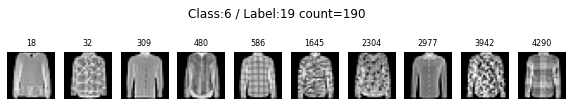

class:6/label:20 = 142 (2.3666666666666667%)


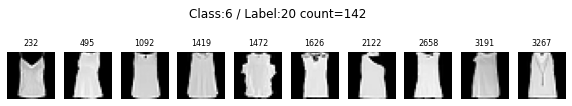

class:6/label:21 = 172 (2.8666666666666667%)


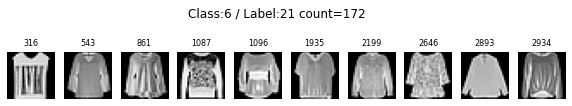

class:6/label:22 = 116 (1.9333333333333333%)


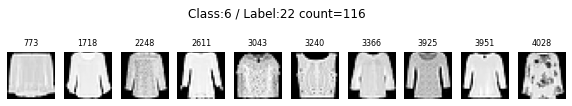

class:6/label:23 = 216 (3.6%)


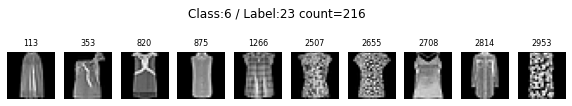

class:6/label:24 = 153 (2.55%)


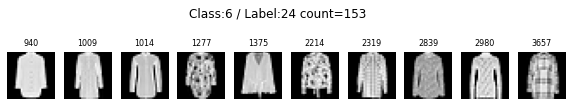

class:6/label:25 = 155 (2.5833333333333335%)


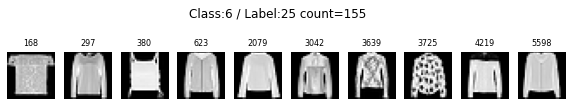

Class(7) start
change bgm_n_components 64 ===> 29
Class(7) label_num=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28]
経過時間：21.64727473258972
class:7/label:0 = 278 (4.633333333333334%)


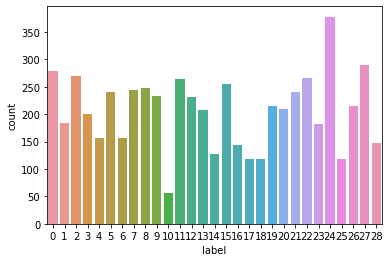

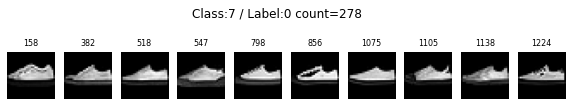

class:7/label:1 = 184 (3.066666666666667%)


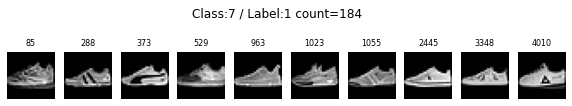

class:7/label:2 = 270 (4.5%)


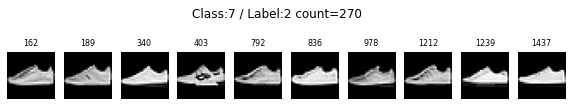

class:7/label:3 = 201 (3.35%)


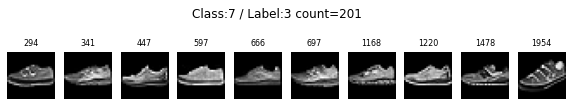

class:7/label:4 = 157 (2.6166666666666667%)


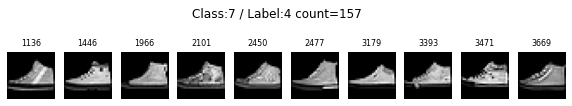

class:7/label:5 = 240 (4.0%)


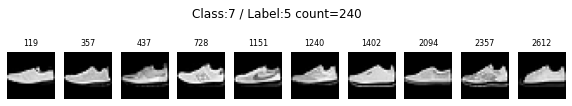

class:7/label:6 = 156 (2.6%)


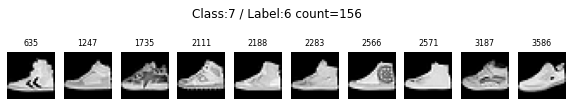

class:7/label:7 = 244 (4.066666666666666%)


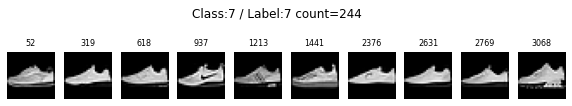

class:7/label:8 = 247 (4.116666666666666%)


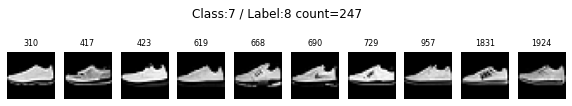

class:7/label:9 = 233 (3.8833333333333333%)


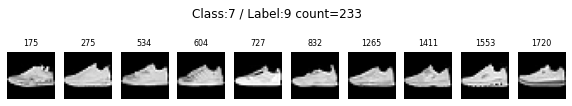

class:7/label:10 = 57 (0.95%)


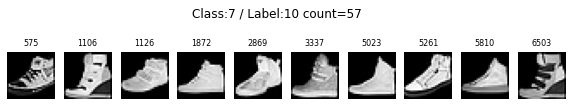

class:7/label:11 = 265 (4.416666666666667%)


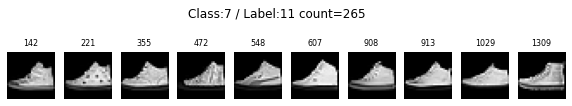

class:7/label:12 = 232 (3.8666666666666667%)


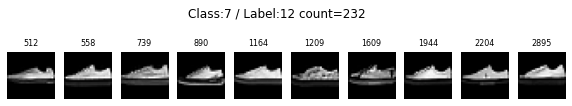

class:7/label:13 = 208 (3.466666666666667%)


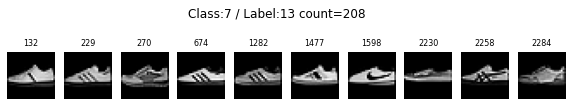

class:7/label:14 = 128 (2.1333333333333333%)


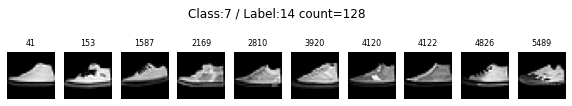

class:7/label:15 = 255 (4.25%)


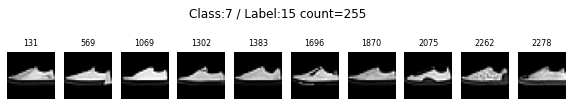

class:7/label:16 = 144 (2.4%)


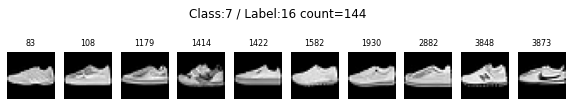

class:7/label:17 = 119 (1.9833333333333334%)


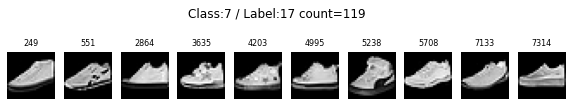

class:7/label:18 = 118 (1.9666666666666666%)


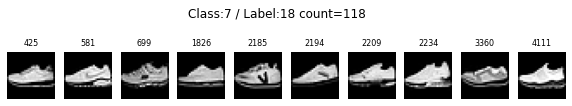

class:7/label:19 = 215 (3.5833333333333335%)


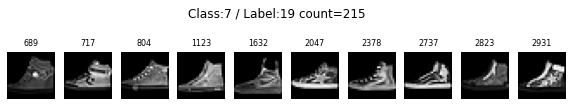

class:7/label:20 = 210 (3.5%)


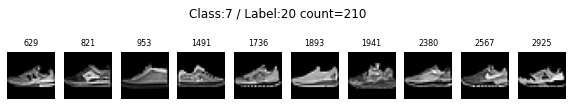

class:7/label:21 = 241 (4.016666666666667%)


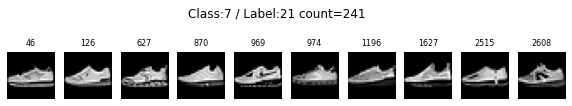

class:7/label:22 = 266 (4.433333333333334%)


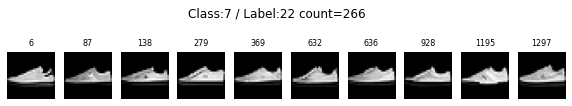

class:7/label:23 = 183 (3.05%)


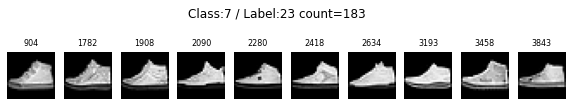

class:7/label:24 = 378 (6.3%)


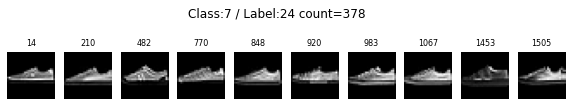

class:7/label:25 = 119 (1.9833333333333334%)


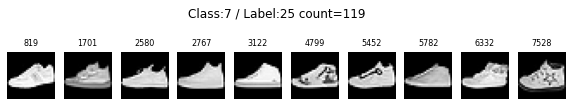

class:7/label:26 = 215 (3.5833333333333335%)


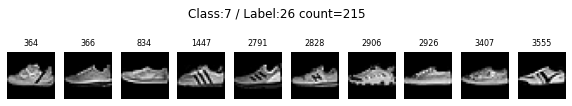

class:7/label:27 = 290 (4.833333333333333%)


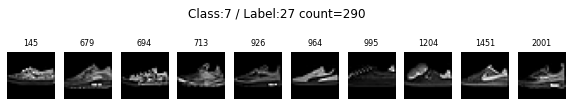

class:7/label:28 = 147 (2.45%)


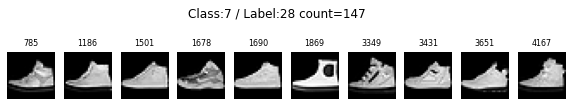

Class(8) start
change bgm_n_components 64 ===> 26
Class(8) label_num=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25]
経過時間：19.221417903900146
class:8/label:0 = 241 (4.016666666666667%)


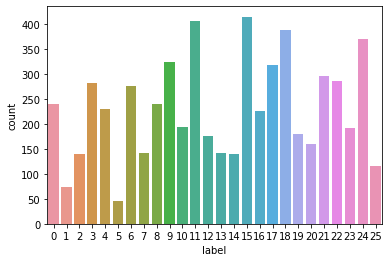

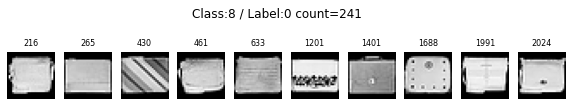

class:8/label:1 = 73 (1.2166666666666666%)


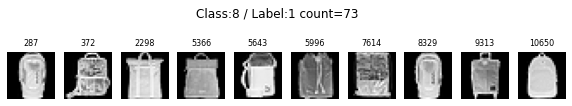

class:8/label:2 = 139 (2.316666666666667%)


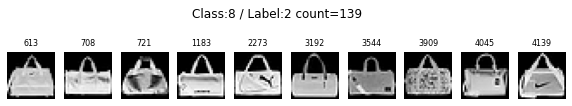

class:8/label:3 = 282 (4.7%)


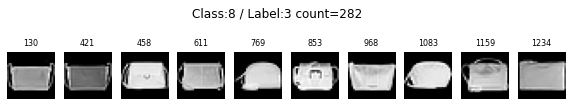

class:8/label:4 = 231 (3.85%)


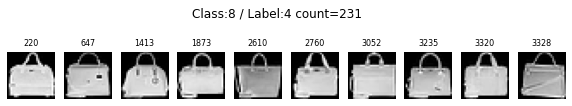

class:8/label:5 = 46 (0.7666666666666667%)


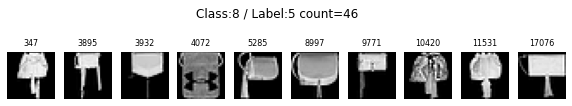

class:8/label:6 = 276 (4.6%)


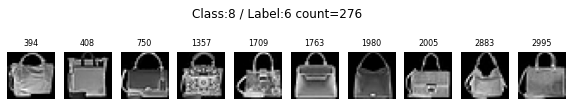

class:8/label:7 = 141 (2.35%)


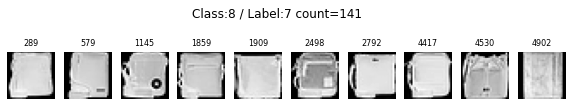

class:8/label:8 = 241 (4.016666666666667%)


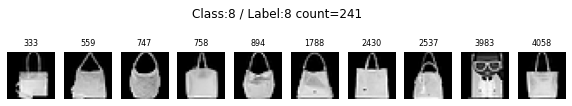

class:8/label:9 = 325 (5.416666666666667%)


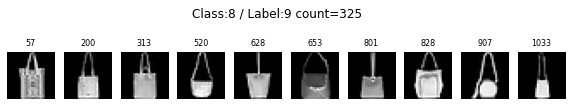

class:8/label:10 = 193 (3.216666666666667%)


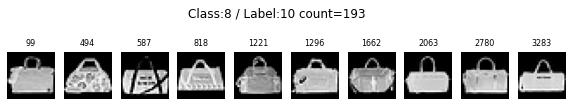

class:8/label:11 = 406 (6.766666666666667%)


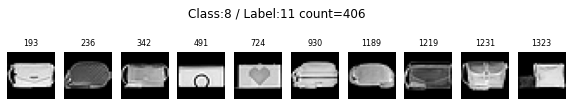

class:8/label:12 = 176 (2.933333333333333%)


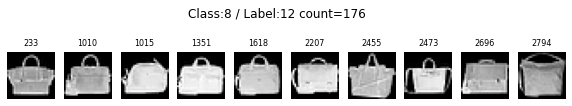

class:8/label:13 = 141 (2.35%)


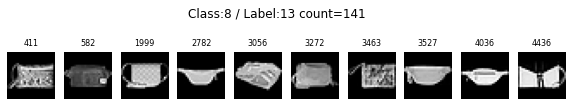

class:8/label:14 = 140 (2.3333333333333335%)


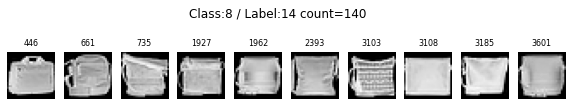

class:8/label:15 = 415 (6.916666666666667%)


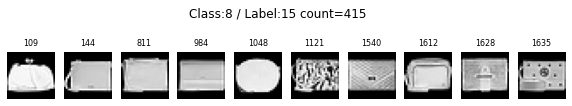

class:8/label:16 = 227 (3.783333333333333%)


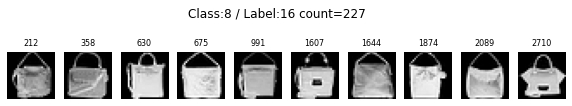

class:8/label:17 = 319 (5.316666666666666%)


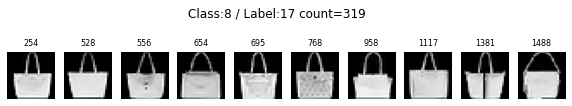

class:8/label:18 = 388 (6.466666666666667%)


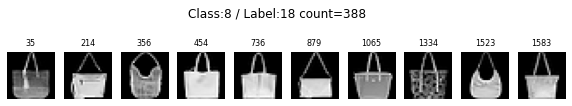

class:8/label:19 = 180 (3.0%)


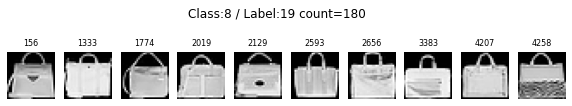

class:8/label:20 = 159 (2.65%)


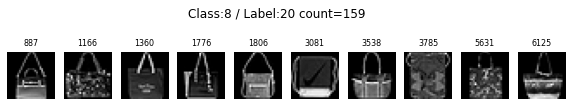

class:8/label:21 = 296 (4.933333333333334%)


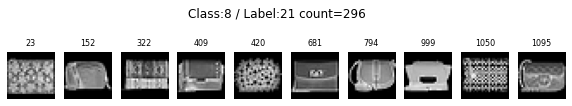

class:8/label:22 = 286 (4.766666666666667%)


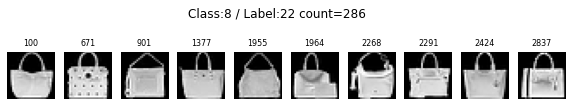

class:8/label:23 = 192 (3.2%)


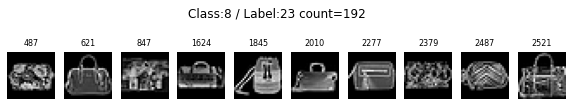

class:8/label:24 = 371 (6.183333333333334%)


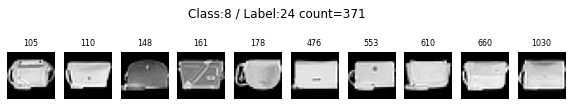

class:8/label:25 = 116 (1.9333333333333333%)


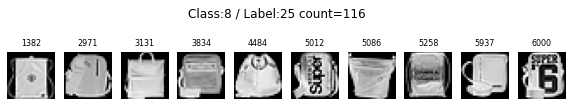

Class(9) start
change bgm_n_components 64 ===> 31
Class(9) label_num=[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30]
経過時間：17.38975691795349
class:9/label:0 = 139 (2.316666666666667%)


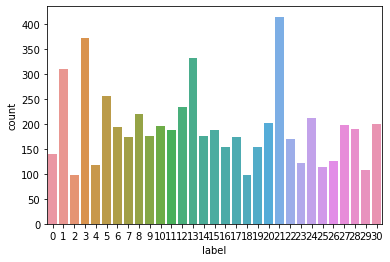

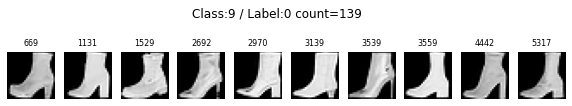

class:9/label:1 = 311 (5.183333333333334%)


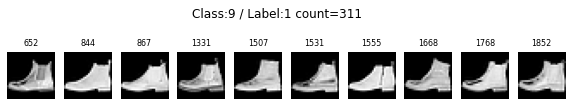

class:9/label:2 = 97 (1.6166666666666667%)


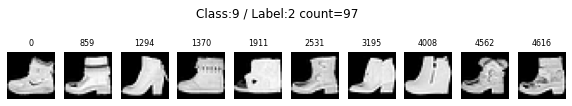

class:9/label:3 = 372 (6.2%)


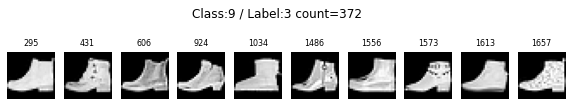

class:9/label:4 = 117 (1.95%)


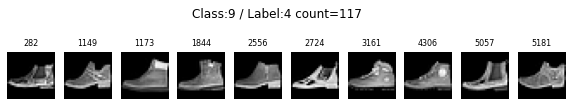

class:9/label:5 = 257 (4.283333333333333%)


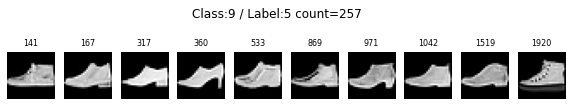

class:9/label:6 = 193 (3.216666666666667%)


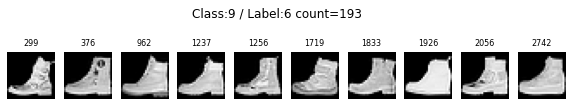

class:9/label:7 = 174 (2.9%)


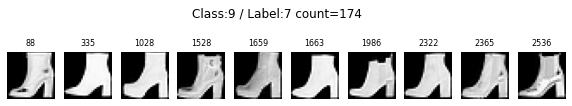

class:9/label:8 = 220 (3.6666666666666665%)


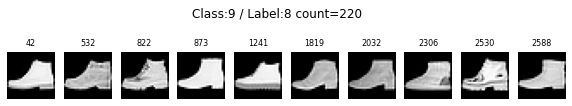

class:9/label:9 = 175 (2.9166666666666665%)


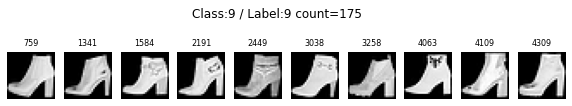

class:9/label:10 = 196 (3.2666666666666666%)


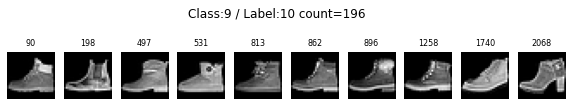

class:9/label:11 = 188 (3.1333333333333333%)


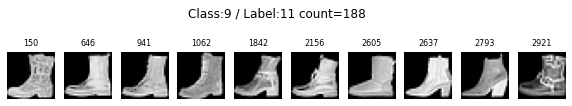

class:9/label:12 = 235 (3.9166666666666665%)


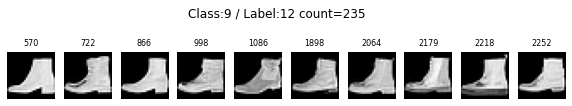

class:9/label:13 = 332 (5.533333333333333%)


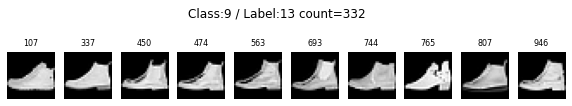

class:9/label:14 = 176 (2.933333333333333%)


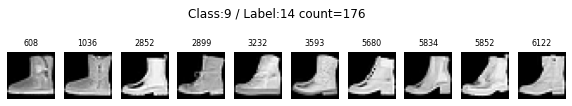

class:9/label:15 = 187 (3.1166666666666667%)


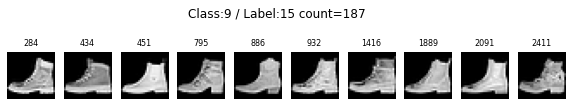

class:9/label:16 = 153 (2.55%)


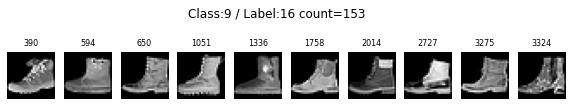

class:9/label:17 = 173 (2.8833333333333333%)


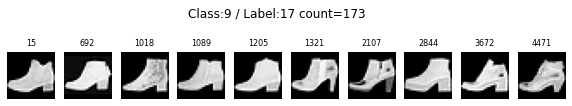

class:9/label:18 = 98 (1.6333333333333333%)


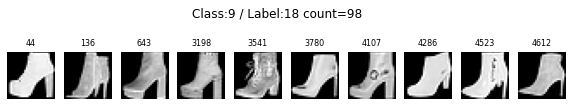

class:9/label:19 = 153 (2.55%)


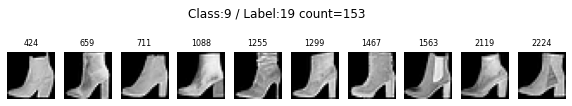

class:9/label:20 = 203 (3.3833333333333333%)


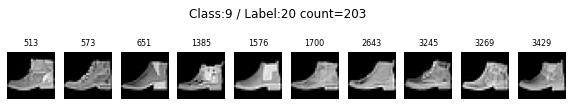

class:9/label:21 = 415 (6.916666666666667%)


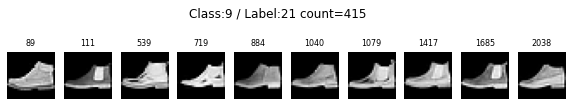

class:9/label:22 = 169 (2.816666666666667%)


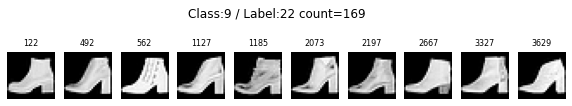

class:9/label:23 = 121 (2.0166666666666666%)


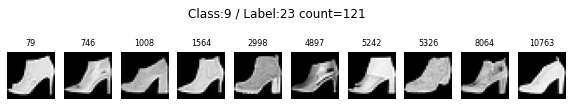

class:9/label:24 = 212 (3.533333333333333%)


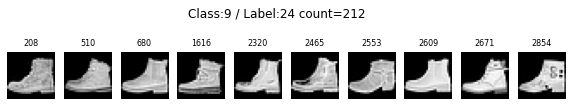

class:9/label:25 = 114 (1.9%)


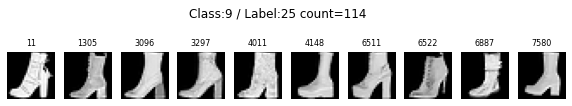

class:9/label:26 = 126 (2.1%)


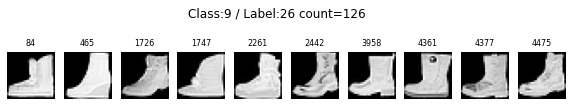

class:9/label:27 = 198 (3.3%)


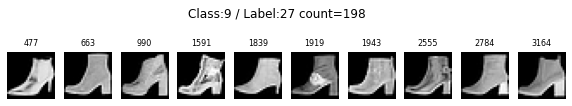

class:9/label:28 = 190 (3.1666666666666665%)


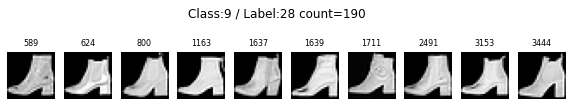

class:9/label:29 = 107 (1.7833333333333334%)


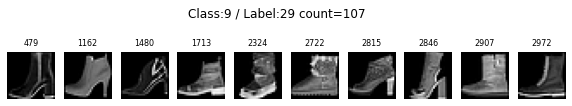

class:9/label:30 = 199 (3.316666666666667%)


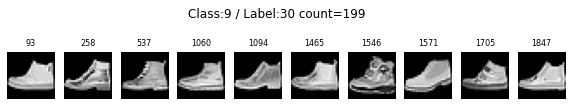

In [4]:
# 画像クラスタリング BayesianGaussianMixture
import time
import numpy as np
import pandas as pd
from sklearn import mixture

# 次元圧縮数
pca_n_components = 128
max_bgm_n_components = 64
max_iter = 5000

def classification(c):
    # class,label,count,percent
    cls_data = np.zeros((0, 4))

    # class,label,index
    index_data = np.zeros((0, 3), dtype=np.int64)

    print(f'Class({c}) start')
    
    t1 = time.time() 

    # 次元圧縮
    X = get_pca(X_target_n[target_indexes[c]], pca_n_components)

    # クラスタリング(クラスタ数取得)
    vbgm = mixture.BayesianGaussianMixture(n_components=max_bgm_n_components, max_iter=max_iter).fit(X)
    vbgm.predict(X)

    # クラスタ数算出
    bgm_n_components = len(np.where(vbgm.weights_>vbgm.weights_.mean())[0])
    print(f'change bgm_n_components {max_bgm_n_components} ===> {bgm_n_components}')
    
    # クラスタリング
    vbgm = mixture.BayesianGaussianMixture(n_components=bgm_n_components, max_iter=max_iter).fit(X)
    labels = vbgm.predict(X)

    print('Class({}) label_num={}'.format(c, np.unique(labels)))

    t2 = time.time()
    print(f"経過時間：{t2-t1}")

    # ヒストグラム出力
    sns.countplot(x='label', data=pd.DataFrame(labels, columns=['label']))
    
    label_classes = np.unique(labels)
    for l in label_classes:
        indexes = np.where(labels == l)[0]
        total_indexes = [target_indexes[c][i] for i in indexes]
        cnt=len(indexes)
        persent=(cnt*100.0)/len(labels)
        print('class:{}/label:{} = {} ({}%)'.format(c, l, cnt, persent))
        
        # 出力df作成
        cls_data = np.vstack((cls_data, [c, l, cnt, persent]))
        for i in total_indexes:
            index_data = np.vstack((index_data, [c, l, i]))

        # 画像出力
        plot_image(X_target, total_indexes[0:10], title=f'Class:{c} / Label:{l} count={cnt}')
        
    # 分類概要情報をCSV出力
    cls_df = pd.DataFrame(cls_data,
                          columns=['class', 'label', 'count', 'persent'])
    cls_df['class'] = cls_df['class'].astype(np.int64)
    cls_df['label'] = cls_df['label'].astype(np.int64)
    cls_df['count'] = cls_df['count'].astype(np.int64)
    cls_df.to_csv(f'class_{c}_cls.csv', header=True, index=True)
    
    # 分類されたインデックスをＣＳＶ出力
    index_df = pd.DataFrame(index_data,
                          columns=['class', 'label', 'index'])
    index_df.to_csv(f'class_{c}_index.csv', header=True, index=True)

for c in classes:
    classification(c)

In [5]:
# # 1：ライブラリのインポート--------------------------------
# import numpy as np #numpyという行列などを扱うライブラリを利用
# import pandas as pd #pandasというデータ分析ライブラリを利用
# import matplotlib.pyplot as plt #プロット用のライブラリを利用
# from sklearn import cluster, preprocessing, mixture #機械学習用のライブラリを利用

# import time


# n_components = 128
# for c in classes:

#     t1 = time.time() 
    
#     # 次元圧縮
#     X = get_pca(X_target_n[target_indexes[c]], n_components)

#     # クラスタリング
#     ms = cluster.MeanShift(seeds=X)
#     ms.fit(X)
#     labels = ms.labels_
#     print('Class({}) label_num={}'.format(c, np.unique(labels)))

#     t2 = time.time()
#     print(f"経過時間：{t2-t1}")

#     # クラスタ中心点
#     cluster_centers = ms.cluster_centers_
#     print(cluster_centers)


経過時間：44.498159408569336


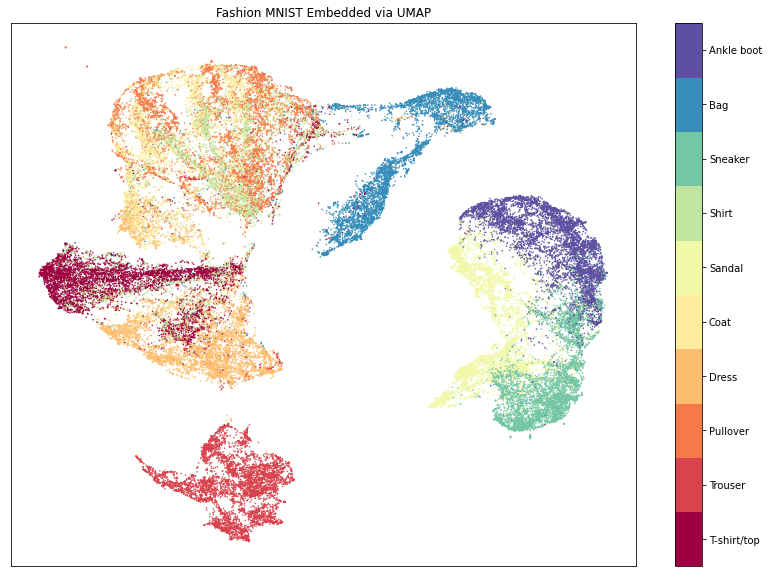

In [7]:
# UMAP on Fashion MNIST
import umap
import time


t1 = time.time() 
embedding = umap.UMAP(n_neighbors=5).fit_transform(X_target_n)
t2 = time.time()
print(f"経過時間：{t2-t1}")

fig, ax = plt.subplots(1, figsize=(14, 10))
plt.scatter(*embedding.T, s=0.3, c=y_target, cmap='Spectral', alpha=1.0)
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(class_names)
plt.title('Fashion MNIST Embedded via UMAP');

経過時間：40.32739520072937


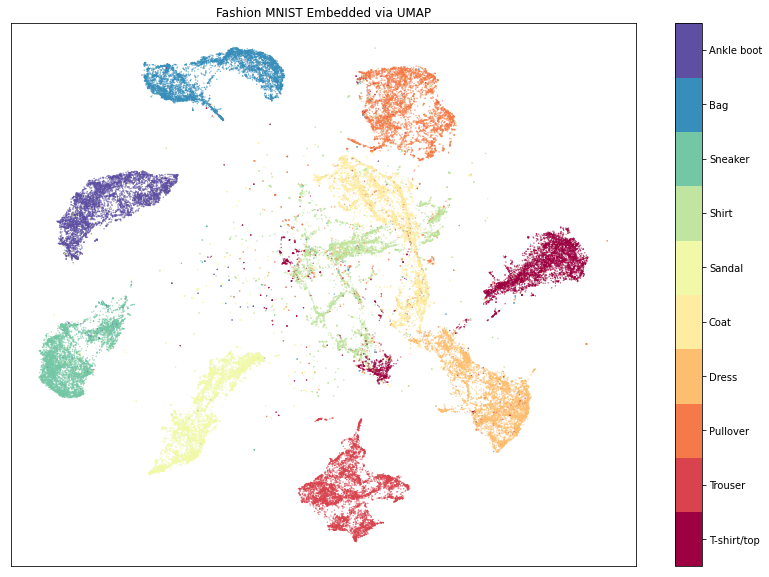

In [8]:
# Using Labels to Separate Classes (Supervised UMAP)
import umap
import time


t1 = time.time() 
embedding = umap.UMAP(n_neighbors=5).fit_transform(X_target_n ,y=y_target)
t2 = time.time()
print(f"経過時間：{t2-t1}")

fig, ax = plt.subplots(1, figsize=(14, 10))
plt.scatter(*embedding.T, s=0.1, c=y_target, cmap='Spectral', alpha=1.0)
plt.setp(ax, xticks=[], yticks=[])
cbar = plt.colorbar(boundaries=np.arange(11)-0.5)
cbar.set_ticks(np.arange(10))
cbar.set_ticklabels(class_names)
plt.title('Fashion MNIST Embedded via UMAP');


In [9]:
# UMAP as a Feature Extraction Technique for Classification
# https://umap-learn.readthedocs.io/en/latest/auto_examples/plot_feature_extraction_classification.html
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC

from umap import UMAP

# Make a toy dataset
X, y = make_classification(
    n_samples=1000,
    n_features=300,
    n_informative=250,
    n_redundant=0,
    n_repeated=0,
    n_classes=2,
    random_state=1212,
)

# Split the dataset into a training set and a test set
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Classification with a linear SVM
svc = LinearSVC(dual=False, random_state=123)
params_grid = {"C": [10 ** k for k in range(-3, 4)]}
clf = GridSearchCV(svc, params_grid)
clf.fit(X_train, y_train)
print(
    "Accuracy on the test set with raw data: {:.3f}".format(clf.score(X_test, y_test))
)

# Transformation with UMAP followed by classification with a linear SVM
umap = UMAP(random_state=456)
pipeline = Pipeline([("umap", umap), ("svc", svc)])
params_grid_pipeline = {
    "umap__n_neighbors": [5, 20],
    "umap__n_components": [15, 25, 50],
    "svc__C": [10 ** k for k in range(-3, 4)],
}


clf_pipeline = GridSearchCV(pipeline, params_grid_pipeline)
clf_pipeline.fit(X_train, y_train)
print(
    "Accuracy on the test set with UMAP transformation: {:.3f}".format(
        clf_pipeline.score(X_test, y_test)
    )
)

Accuracy on the test set with raw data: 0.755
Accuracy on the test set with UMAP transformation: 0.935
